# Ice Algae timing 

Pan-Arctic plots of diagnostics of light and N limitation timing

## Setup

In [1]:
import xarray as xr
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.dates as mdate
import matplotlib.gridspec as gridspec
import matplotlib.colors as colors
from matplotlib.lines import Line2D
from matplotlib.ticker import LogLocator
import matplotlib.patches as mpatches

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import palettable.cmocean.sequential as cmOcSeq
import palettable.cmocean.diverging as cmOcDiv
import seaborn as sns

from datetime import datetime, timedelta

from glob import glob 

import utilsRegions as urgn
import utilsGen as utl
import mapPlots as mplt
import diagnostics as dgnst
import utlshistograms as uhist

%load_ext autoreload
%autoreload 2

In [51]:
from dask.distributed import Client, LocalCluster
cluster = LocalCluster(dashboard_address=':8188',n_workers=16, threads_per_worker=1)
client = Client(cluster)

http://127.0.0.1:8188/status

In [50]:
cluster.close()
client.close()

In [5]:
scenarios = ['historical-DFS-G510.00','RCP85-G510.14-G515.00-01']
hist,rcp85 = scenarios
periods = ['1981-2000','2023-2042','2066-2085']
past,pres,futur=periods
runs={past:hist, pres:rcp85, futur:rcp85}
timeperiod = {past: slice('1981','2000'), pres:slice('2023','2042'), futur: slice('2066','2085') }

dadic={}
datadir = '/tsanta/ahaddon/data/'
utl.loadNAAmesh(dadic)

### Load model output

In [4]:
for scn in scenarios:
    dadic[scn+'biolog'] = xr.open_mfdataset(datadir+scn+'/NAA_1d_*_biolog.nc', combine='by_coords', parallel=True,chunks={'time_counter':365,'x':100,'y':100})
    dadic[scn+'diad'] = xr.open_mfdataset(datadir+scn+'/NAA_730h_*_diad_T.nc', combine='by_coords', parallel=True)

In [5]:
dadic[scn+'biolog']

<xarray.Dataset>
Dimensions:            (time_counter: 25550, y: 400, x: 568, deptht: 46,
                        tbnds: 2)
Coordinates:
  * deptht             (deptht) float32 0.5487 1.973 ... 5.622e+03 5.878e+03
    nav_lat            (y, x) float32 dask.array<chunksize=(100, 100), meta=np.ndarray>
    nav_lon            (y, x) float32 dask.array<chunksize=(100, 100), meta=np.ndarray>
  * time_counter       (time_counter) object 2016-01-01 12:00:00 ... 2085-12-...
Dimensions without coordinates: y, x, tbnds
Data variables: (12/19)
    Cflx               (time_counter, y, x) float32 dask.array<chunksize=(365, 100, 100), meta=np.ndarray>
    Delc               (time_counter, y, x) float32 dask.array<chunksize=(365, 100, 100), meta=np.ndarray>
    Kg                 (time_counter, y, x) float32 dask.array<chunksize=(365, 100, 100), meta=np.ndarray>
    SSS                (time_counter, y, x) float32 dask.array<chunksize=(365, 100, 100), meta=np.ndarray>
    SST                (time_counter, y, x) float32 dask.array<chunksize=(365, 100, 100), meta=np.ndarray>
    fstricgca          (time_counter, y, x) float32 dask.array<chunksize=(365, 100, 100), meta=np.ndarray>
    ...                 ...
    pCO2_atm           (time_counter, y, x) float32 dask.array<chunksize=(365, 100, 100), meta=np.ndarray>
    pCO2_sw            (time_counter, y, x) float32 dask.array<chunksize=(365, 100, 100), meta=np.ndarray>
    sfcocedms          (time_counter, y, x) float32 dask.array<chunksize=(365, 100, 100), meta=np.ndarray>
    sfcoceno3          (time_counter, y, x) float32 dask.array<chunksize=(365, 100, 100), meta=np.ndarray>
    sfcocepar          (time_counter, y, x) float32 dask.array<chunksize=(365, 100, 100), meta=np.ndarray>
    time_counter_bnds  (time_counter, tbnds) object dask.array<chunksize=(365, 2), meta=np.ndarray>
Attributes:
    Conventions:  CF-1.1
    production:   An IPSL model
    TimeStamp:    23/12/2020 00:39:33 -0500
    file_name:    NAA_1d_20160101_20161231_biolog.nc
    history:      Wed Dec 23 05:34:27 2020: ncks -4 -L 1 -O NAA_1d_20160101_2...
    NCO:          4.6.6

### Load diagnostics

In [6]:
processDataDir = '/tsanta/ahaddon/NAA/processedData/'
# processDataDir = '/home/ahaddon/Work/NAA/processedData/'
# varsave = ['icedia','ileadfra2','fstric','iceno3','icenh4','icedia','limN','limpar']#,'iicethic','isnowthi'
varsave = ['icedia','iceGPPfall']#,'iicethic','isnowthi'
clim={}
for per in periods: 
    scn=runs[per] 
    for var in varsave:
        clim[per+var] = xr.open_dataarray(f'{processDataDir}{scn}/panArctic/{var}_20yclim{per}_1d.nc')

In [7]:
for per in periods: 
    clim[per+'meanIA'] = clim[per+'icedia'].sel(dayofyear=slice(60,181)).mean(dim='dayofyear').compute()
    clim[per+'peakIAfall'] = clim[per+'icedia'].sel(dayofyear=slice(250,365)).max(dim='dayofyear').compute()
    clim[per+'peakIA'] = clim[per+'icedia'].sel(dayofyear=slice(1,250)).max(dim='dayofyear').compute()
diffIAmean=clim[futur+'meanIA'] - clim[past+'meanIA'].compute()
diffIApeak=clim[futur+'peakIA'] - clim[past+'peakIA'].compute()

In [8]:
climdiag={}
for per in periods:
    scn=runs[per] 
    climdiag[per] = xr.open_dataset(f'{processDataDir}{scn}/panArctic/IAdiagnostics_20yclim{per}.nc').compute()
climdiag[periods[0]]

<xarray.Dataset>
Dimensions:                 (y: 400, x: 568)
Coordinates:
    nav_lat                 (y, x) float32 53.41 53.48 53.56 ... 44.23 44.11
    nav_lon                 (y, x) float32 -132.6 -132.5 -132.4 ... 15.75 15.66
Dimensions without coordinates: y, x
Data variables: (12/22)
    doyNlim5                (y, x) float64 nan nan nan nan ... nan nan nan nan
    doyPARlim15             (y, x) float64 nan nan nan nan ... nan nan nan nan
    doyPARlim5              (y, x) float64 nan nan nan nan ... nan nan nan nan
    doySIbreak              (y, x) float64 nan nan nan nan ... nan nan nan nan
    doyPARlimGTnlim         (y, x) float64 nan nan nan nan ... nan nan nan nan
    least_lim               (y, x) float32 nan nan nan nan ... nan nan nan nan
    ...                      ...
    least_lim_nyears        (y, x) int64 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    nonLimGwth_nyears       (y, x) int64 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    lengthPAR_nyears        (y, x) int64 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    doyIApeak_nyears        (y, x) int64 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    doySIfreezeUp_nyears    (y, x) int64 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
    doyIAstd_nyears         (y, x) int64 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0

## Maps

### Ice Algae

#### IA spring mean

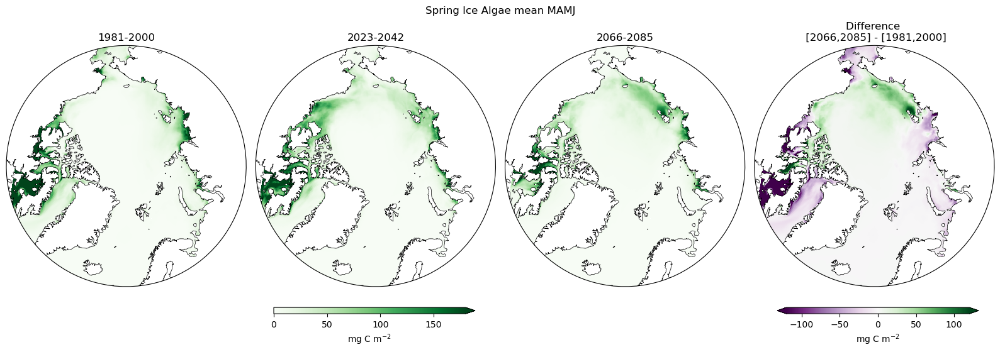

In [12]:
# plt.rcParams.update({'font.size': 16})
fig,ax = mplt.initmaps(1,4,figsize=(16,5),rnd=True,extent=[-180,180, 62,90])
fig.suptitle('Spring Ice Algae mean MAMJ')
fig.tight_layout()

for i,per in enumerate(periods):
    f,a,pl=mplt.singleMap(clim[per+'meanIA']*12, dadic, fig=fig,ax=ax[i], cbar=False, 
                          title=per, vmin=0,vmax=15*12, extend='max',
                          # cmap=cmOcSeq.Algae_5.mpl_colormap, 
                          cmap='Greens', #hatchMsk=climdiag[per]['SIgt50_nyears']<20,
                        # norm=colors.LogNorm(vmin=0.1, vmax=10)
                           )
cbar_ax = fig.add_axes([3/8-0.1, 0., 0.2, 0.02])                               
cl = fig.colorbar(pl,cax=cbar_ax, extend='max', orientation='horizontal', shrink=0.4)
cl.set_label('mg C m$^{-2}$')

f,a,pl=mplt.singleMap(diffIAmean*12, dadic, fig=fig,ax=ax[3],  
                          title='Difference \n [2066,2085] - [1981,2000]', cbar=False, vmin=-10*12,vmax=10*12,
                          # cmap=cmOcDiv.Delta_5.mpl_colormap, 
                          cmap='PRGn', #hatchMsk=(climdiag[scenarios[0]]['SIgt50_nyears']<20)|(climdiag[scenarios[1]]['SIgt50_nyears']<20)
                           )
cbar_ax = fig.add_axes([7/8-0.1, 0., 0.2, 0.02])                               
cl = fig.colorbar(pl,cax=cbar_ax, extend='both', orientation='horizontal', shrink=0.4)
cl.set_label('mg C m$^{-2}$')

#### IA maximum

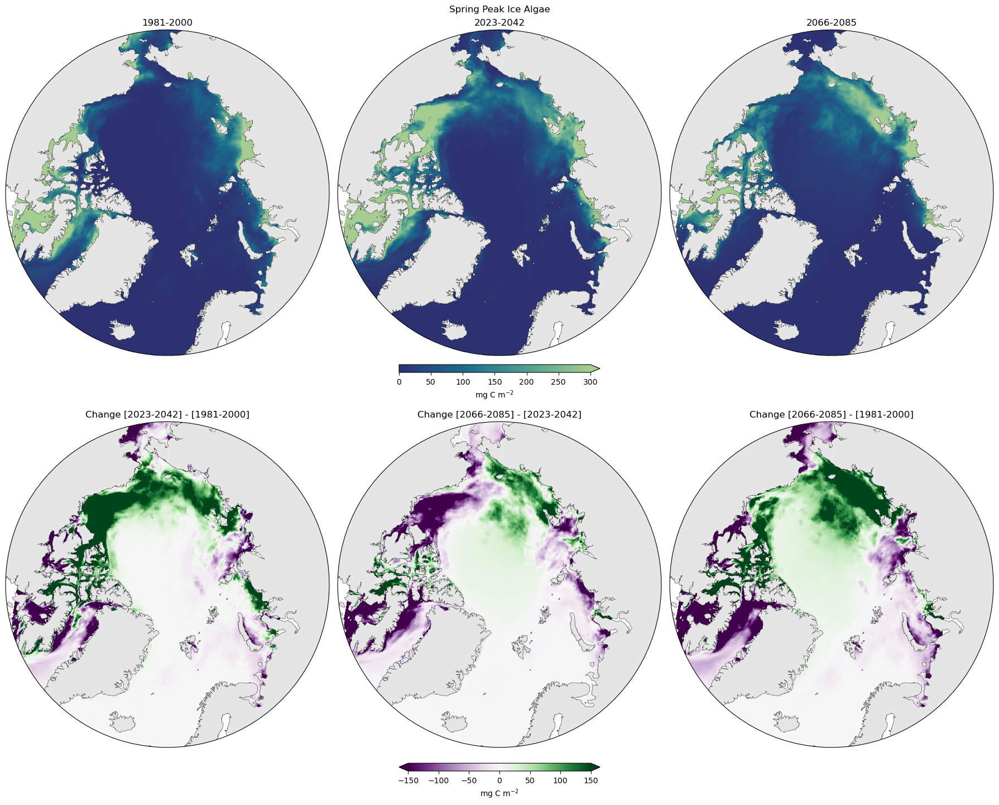

In [41]:
fig,ax = mplt.initmaps(2,3,figsize=(18,14),rnd=True,extent=[-180,180, 62,90])
fig.suptitle('Spring Peak Ice Algae')
fig.tight_layout()
fig.subplots_adjust(hspace=0.1)

for i,per in enumerate(periods):
    f,a,pl=mplt.singleMap(clim[per+'peakIA']*12, dadic, fig=fig,ax=ax[0,i], cbar=False, 
                          title=per, 
                          cmap='crest_r', #hatchMsk=climdiag[per]['SIgt50_nyears']<20,
                          vmin=0,vmax=300, 
                          # norm=colors.LogNorm(vmin=1, vmax=1000)#50*12)
                           )
cbar_ax = fig.add_axes([0.5-0.1, 0.5+0.01, 0.2, 0.01])                               
cl = fig.colorbar(pl,cax=cbar_ax, extend='max', orientation='horizontal', shrink=0.4)
cl.set_label('mg C m$^{-2}$')
# cbar_ax.set_xticks([1,10,100,1000], [1,10,100,1000])

for i in [1,2]:
    f,a,pl=mplt.singleMap(clim[periods[i]+'peakIA']*12 -  clim[past+'peakIA']*12, 
                          dadic, fig=fig,ax=ax[1,(i-1)*2],  
                              title=f'Change [{periods[i]}] - [{past}]', cbar=False, vmin=-100,vmax=100,
                              cmap='PRGn',
                               )

f,a,pl=mplt.singleMap(clim[futur+'peakIA']*12- clim[pres+'peakIA']*12, 
                      dadic, fig=fig,ax=ax[1,1],  
                      title=f'Change [{futur}] - [{pres}]', cbar=False, vmin=-150,vmax=150,
                      cmap='PRGn',
                           )
cbar_ax = fig.add_axes([0.5-0.1, 0., 0.2, 0.01])                               
cl = fig.colorbar(pl,cax=cbar_ax, extend='both', orientation='horizontal', shrink=0.4)
cl.set_label('mg C m$^{-2}$')

#### Fall IA maximum

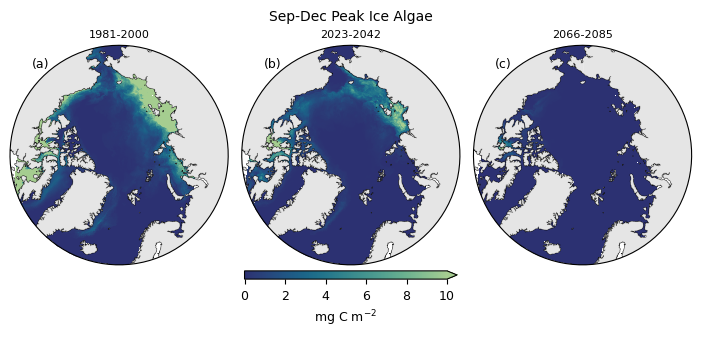

In [21]:
fig,ax = mplt.initmaps(1,3,figsize=(18/2.54,7/2.54),rnd=True,extent=[-180,180, 62,90])
plt.rcParams.update({'font.size': 9})

# fig,ax = mplt.initmaps(1,3,figsize=(18,7),rnd=True,extent=[-180,180, 62,90])
fig.suptitle('Sep-Dec Peak Ice Algae',fontsize=10)
fig.tight_layout()

for i,per in enumerate(periods):
    f,a,pl=mplt.singleMap(clim[per+'peakIAfall']*12, dadic, fig=fig,ax=ax[i], cbar=False, 
                          title=None, 
                          cmap='crest_r', 
                          vmin=0,vmax=10, 
                          # norm=colors.LogNorm(vmin=0.1, vmax=100)#50*12)
                           )
    a.set_title(per, fontsize=8)

ltr=['a','b','c','d','e','f','g','h','i','j','k','l','m','n','o','p','q','r','s','t','u','v','w','x','y','z']
for il,a in enumerate(fig.axes): a.text(0.1,0.9,f'({ltr[il]})',transform=a.transAxes)

cbar_ax = fig.add_axes([0.5-0.15, 0., 0.3, 0.03])                               
cl = fig.colorbar(pl,cax=cbar_ax, extend='max', orientation='horizontal', shrink=0.5)
cl.set_label('mg C m$^{-2}$')
# cbar_ax.set_xticks([0.1,1,10,100], [0.1,1,10,100])

plt.savefig('../figs/IAphenology23/IAfallMax-300dpi.png',bbox_inches='tight',dpi=300)
plt.savefig('../figs/IAphenology23/IAfallMax-90dpi.png',bbox_inches='tight',dpi=150)

# f,a,pl=mplt.singleMap(clim[futur+'peakIAfall']*12 - clim[past+'peakIAfall']*12, 
#                       dadic, fig=fig,ax=ax[3],  
#                           title='Difference', cbar=False, 
#                       #vmin=-1,vmax=1,
#                       norm=colors.SymLogNorm(linthresh=.1, linscale=.1, vmin=-100, vmax=100),
#                           cmap='PRGn',
#                            )
# cbar_ax = fig.add_axes([7/8-0.1, 0., 0.2, 0.02])                               
# cl = fig.colorbar(pl,cax=cbar_ax, extend='both', orientation='horizontal', shrink=0.4)
# cl.set_label('mg C m$^{-2}$')
# cbar_ax.set_xticks([-100,-10,-1,0,1,10,100], [-100,-10,-1,0,1,10,100])
# mitic=LogLocator(subs=range(2,10)).tick_values(1,10)[:-8]
# cbar_ax.xaxis.set_ticks(np.concatenate((-mitic,mitic)), minor=True);

# plt.savefig('figs/Fall peak IA change hist rcp85.png',bbox_inches='tight',dpi=150)

#### IA at Phototrophy onset

In [22]:
for i,per in enumerate(periods):
    clim[per+'icedia-photo'] = clim[per+'icedia'].where(climdiag[per]['doyPARlim15']>=0).sel(dayofyear=climdiag[per]['doyPARlim15'].fillna(1).astype(int) )
    # clim[per+'icedia-photo']= iaphto.where(iaphto>clim[per+'icedia'].sel(dayofyear=1))

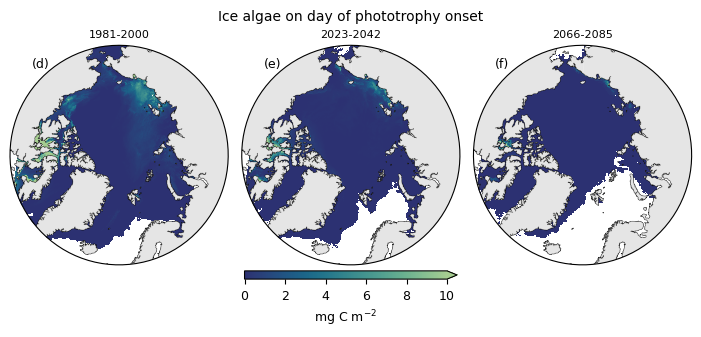

In [24]:
fig,ax = mplt.initmaps(1,3,figsize=(18/2.54,7/2.54),rnd=True,extent=[-180,180, 62,90])
plt.rcParams.update({'font.size': 9})

# fig,ax = mplt.initmaps(1,3,figsize=(18,7),rnd=True,extent=[-180,180, 62,90])
fig.suptitle('Ice algae on day of phototrophy onset', fontsize=10)
fig.tight_layout()

for i,per in enumerate(periods):
    f,a,pl=mplt.singleMap(clim[per+'icedia-photo'], 
                          dadic, fig=fig,ax=ax[i], cbar=False, 
                          title=None, 
                          cmap='crest_r', 
                          vmin=0,vmax=10, 
                          # norm=colors.LogNorm(vmin=0.1, vmax=100)#50*12)
                           )
    a.set_title(per, fontsize=8)

ltr=['a','b','c','d','e','f','g','h','i','j','k','l','m','n','o','p','q','r','s','t','u','v','w','x','y','z']
for il,a in enumerate(fig.axes): a.text(0.1,0.9,f'({ltr[il+3]})',transform=a.transAxes)

cbar_ax = fig.add_axes([0.5-0.15, 0., 0.3, 0.03])                               
cl = fig.colorbar(pl,cax=cbar_ax, extend='max', orientation='horizontal', shrink=0.5)
cl.set_label('mg C m$^{-2}$')

plt.savefig('../figs/IAphenology23/IAconcPhototrophy-300dpi.png',bbox_inches='tight',dpi=300)
plt.savefig('../figs/IAphenology23/IAconcPhototrophy-90dpi.png',bbox_inches='tight',dpi=90)

#### Ice Fall GPP

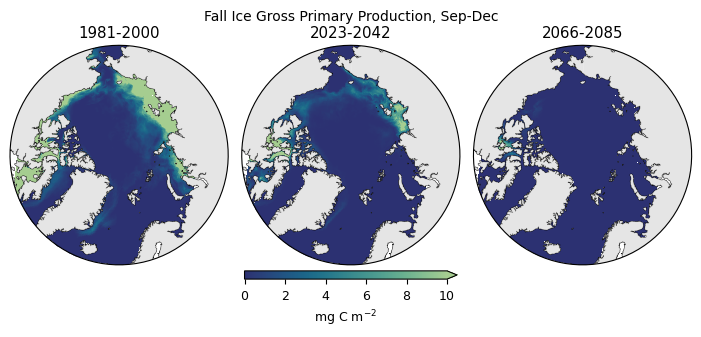

In [12]:
fig,ax = mplt.initmaps(1,3,figsize=(18/2.54,7/2.54),rnd=True,extent=[-180,180, 62,90])
plt.rcParams.update({'font.size': 9})

# fig,ax = mplt.initmaps(1,3,figsize=(18,7),rnd=True,extent=[-180,180, 62,90])
fig.suptitle('Fall Ice Gross Primary Production', fontsize=10)
fig.tight_layout()


for i,per in enumerate(periods):
    f,a,pl=mplt.singleMap(clim[per+'iceGPPfall']*12 , # conversion to mg C m-2
                          dadic, fig=fig,ax=ax[i], cbar=False, 
                          title=per, 
                          cmap='crest_r', 
                          vmin=0,vmax=10, 
                          # norm=colors.LogNorm(vmin=0.1, vmax=100)#50*12)
                           )
cbar_ax = fig.add_axes([0.5-0.15, 0., 0.3, 0.03])                               
cl = fig.colorbar(pl,cax=cbar_ax, extend='max', orientation='horizontal', shrink=0.5)
cl.set_label('mg C m$^{-2}$')

plt.savefig('figs/IAphenology23/IAgppFall-300dpi.png',bbox_inches='tight',dpi=300)
plt.savefig('figs/IAphenology23/IAgppFall-90dpi.png',bbox_inches='tight',dpi=90)

## Diagnostics from daily data averaged

### Keys dates

In [28]:
def keydateplot(kdate,name):

    fig,ax = mplt.initmaps(2,3,figsize=(18,14),rnd=True,extent=[-180,180, 62,90])
    # fig,ax = mplt.initmaps(2,3,figsize=(18/2.54,14/2.54),rnd=True,extent=[-180,180, 62,90])
    # plt.rcParams.update({'font.size': 9})

    fig.suptitle(name,fontsize=10)
    fig.tight_layout()
    fig.subplots_adjust(hspace=0.1)

    for i,per in enumerate(periods):
        f,a,pl=mplt.singleMap(climdiag[per][kdate], dadic, fig=fig,ax=ax[0,i], cbar=False, 
                              title=per, vmin=30,vmax=210, cmap = sns.color_palette("mako_r", as_cmap=True),
                              hatchMsk=climdiag[per][kdate+'_nyears']<10, hatchlw=0.2, 
                             )
        
    cbar_ax = fig.add_axes([0.5-0.1, 0.5+0.01, 0.2, 0.01])                               
    cl = fig.colorbar(pl,cax=cbar_ax, extend='both', orientation='horizontal', shrink=0.4)
    cl.set_label('day of year')
    cbar_ax.set_xticks(range(30,211,30))

    leg = cbar_ax.legend(loc='lower center', bbox_to_anchor=(1.9, -1.5), handlelength=4, frameon=False,
        handles=[mpatches.Patch(facecolor='w',hatch=r'xxx',label='Diagnostic defined \nfor less than 10 years')])
    leg.get_patches()[0].set_height(22)
    leg.get_patches()[0].set_y(-7)


    for i in [1,2]:
        f,a,pl=mplt.singleMap(climdiag[periods[i]][kdate] - climdiag[past][kdate], 
                              dadic, fig=fig,ax=ax[1,(i-1)*2],  
                                  title=f'Change [{periods[i]}] - [{past}]', cbar=False, vmin=-100,vmax=100,
                                  cmap='PuOr',
                              hatchMsk=(climdiag[periods[i]][kdate+'_nyears']<10)|(climdiag[past][kdate+'_nyears']<10),  hatchlw=0.3,
                                   )

    f,a,pl=mplt.singleMap(climdiag[futur][kdate] - climdiag[pres][kdate], dadic, fig=fig,ax=ax[1,1],  
                          title=f'Change [{futur}] - [{pres}]', cbar=False, vmin=-100,vmax=100, #cmap='PuOr',
                          cmap='PuOr',
                          hatchMsk=(climdiag[futur][kdate+'_nyears']<10)|(climdiag[pres][kdate+'_nyears']<10), hatchlw=0.2,
                               )

    cbar_ax = fig.add_axes([0.5-0.1, 0., 0.2, 0.01])                               
    cl = fig.colorbar(pl,cax=cbar_ax, extend='both', orientation='horizontal', shrink=0.4)
    cl.set_label('days')

In [45]:
def keydateplot_article(kdate,name):

    # fig,ax = mplt.initmaps(2,3,figsize=(18,14),rnd=True,extent=[-180,180, 62,90])
    fig,ax = mplt.initmaps(2,3,figsize=(18/2.54,16/2.54),rnd=True,extent=[-180,180, 62,90])
    plt.rcParams.update({'font.size': 9})

    fig.suptitle(name,fontsize=10)
    fig.tight_layout()
    fig.subplots_adjust(hspace=0.35,wspace=-0.1,top=0.93)

    for i,per in enumerate(periods):
        f,a,pl=mplt.singleMap(climdiag[per][kdate], dadic, fig=fig,ax=ax[0,i], cbar=False, 
                              title=None, vmin=30,vmax=210, cmap = sns.color_palette("mako_r", as_cmap=True),
                              hatchMsk=climdiag[per][kdate+'_nyears']<10, hatchlw=0.2, 
                             )
        ax[0,i].set_title(per, fontsize=8)
        
    cbar_ax = fig.add_axes([0.5-0.15, 0.5+0.015, 0.3, 0.015])                               
    cl = fig.colorbar(pl,cax=cbar_ax, extend='both', orientation='horizontal', shrink=0.4)
    cl.set_label('day of year')
    cbar_ax.set_xticks(range(30,211,30))

    leg = cbar_ax.legend(loc='lower center', bbox_to_anchor=(1.7, -4), handlelength=4, frameon=False,
        handles=[mpatches.Patch(facecolor='w',hatch=r'xxx',label='Diagnostic definition\nsatisfied for less\nthan 10 years')])
    leg.get_patches()[0].set_height(15)
    leg.get_patches()[0].set_y(-4)


    for i in [1,2]:
        f,a,pl=mplt.singleMap(climdiag[periods[i]][kdate] - climdiag[past][kdate], 
                              dadic, fig=fig,ax=ax[1,(i-1)*2],  
                                  title=None, cbar=False, vmin=-100,vmax=100,
                                  cmap='PuOr',
                              hatchMsk=(climdiag[periods[i]][kdate+'_nyears']<10)|(climdiag[past][kdate+'_nyears']<10),  hatchlw=0.3,
                                   )
        ax[1,(i-1)*2].set_title(f'Change [{periods[i]}] - [{past}]', fontsize=8)

    f,a,pl=mplt.singleMap(climdiag[futur][kdate] - climdiag[pres][kdate], dadic, fig=fig,ax=ax[1,1],  
                          title=None, cbar=False, vmin=-100,vmax=100, #cmap='PuOr',
                          cmap='PuOr',
                          hatchMsk=(climdiag[futur][kdate+'_nyears']<10)|(climdiag[pres][kdate+'_nyears']<10), hatchlw=0.2,
                               )
    ax[1,1].set_title(f'Change [{futur}] - [{pres}]', fontsize=8)

    cbar_ax = fig.add_axes([0.5-0.15, 0.0, 0.3, 0.015])                               
    cl = fig.colorbar(pl,cax=cbar_ax, extend='both', orientation='horizontal', shrink=0.4)
    cl.set_label('days')

#### Phototrophy onset

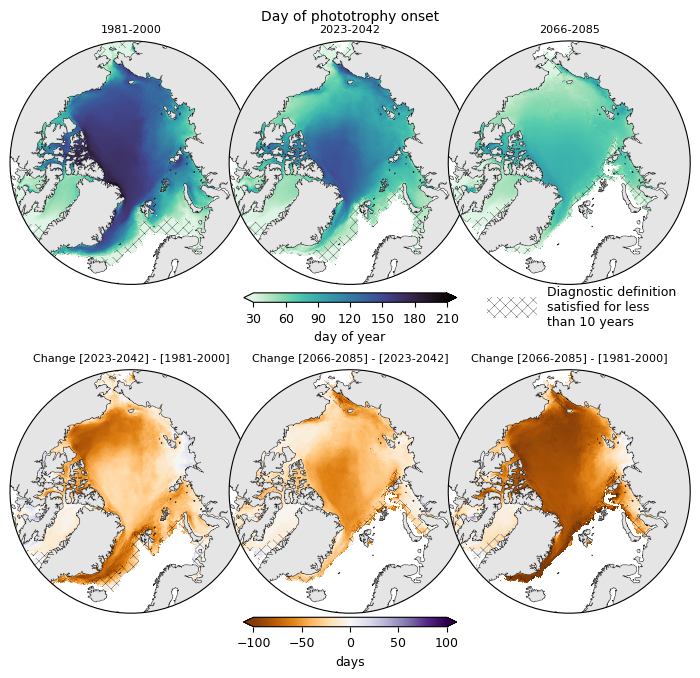

In [52]:
keydateplot_article('doyPARlim15','Day of phototrophy onset')
plt.savefig('../figs/IAphenology23/phototrophyOnset-300dpi.png',bbox_inches='tight',dpi=300)
plt.savefig('../figs/IAphenology23/phototrophyOnset-90dpi.png',bbox_inches='tight',dpi=90)

#### Half PAR

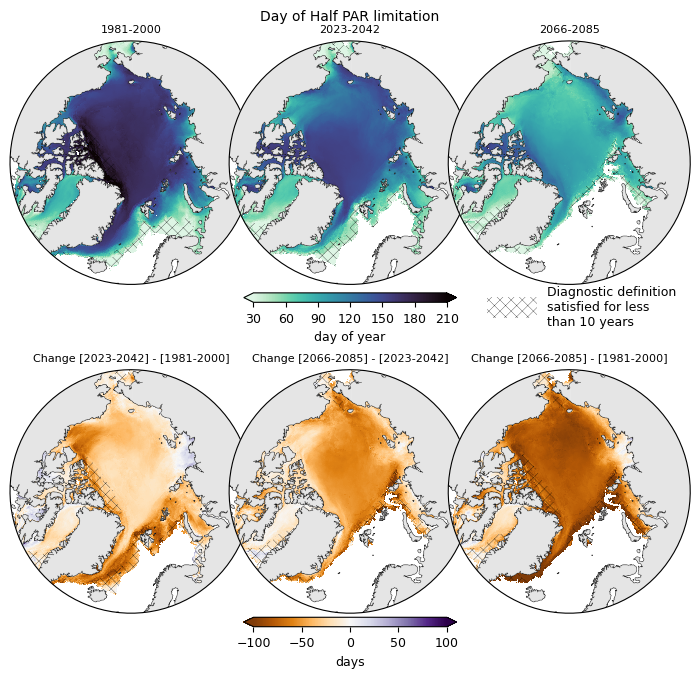

In [53]:
keydateplot_article('doyPARlim5','Day of Half PAR limitation')
plt.savefig('../figs/IAphenology23/halfPAR-300dpi.png',bbox_inches='tight',dpi=300)
plt.savefig('../figs/IAphenology23/halfPAR-90dpi.png',bbox_inches='tight',dpi=90)

#### Lim switch

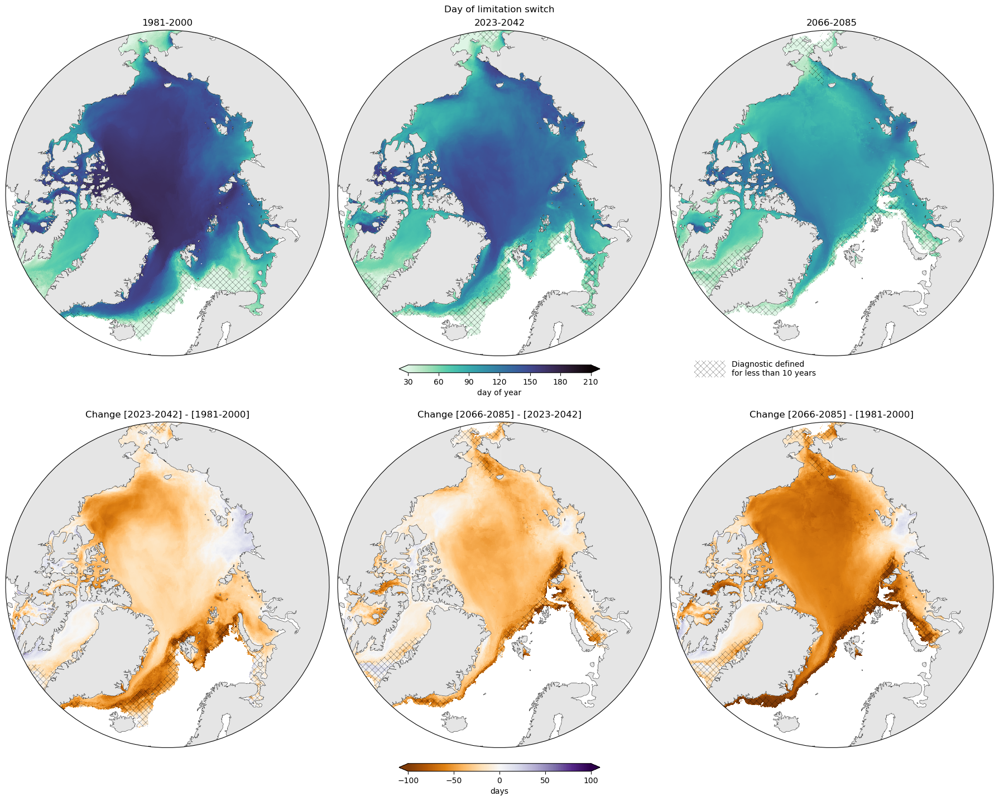

In [46]:
keydateplot('doyPARlimGTnlim','Day of limitation switch')

#### Half N

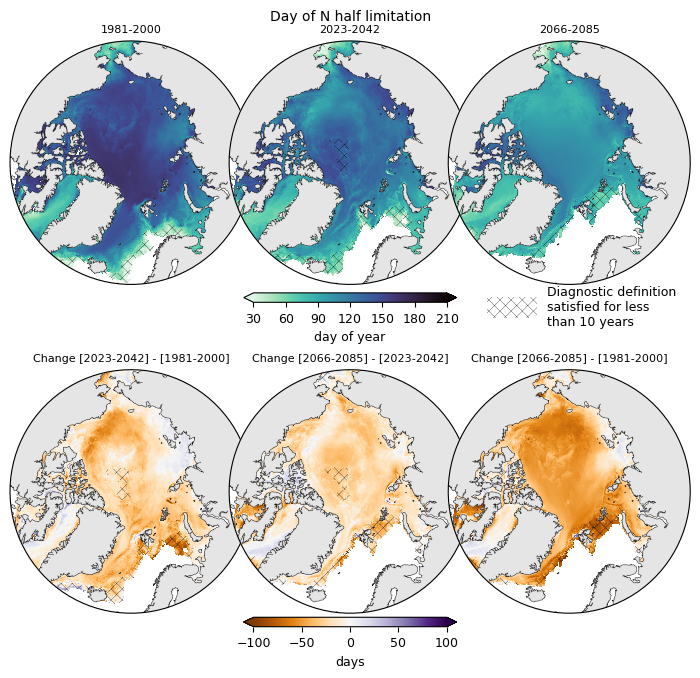

In [54]:
keydateplot_article('doyNlim5','Day of N half limitation')
plt.savefig('../figs/IAphenology23/halfN-300dpi.png',bbox_inches='tight',dpi=300)
plt.savefig('../figs/IAphenology23/halfN-90dpi.png',bbox_inches='tight',dpi=90)

#### Bloom Onset

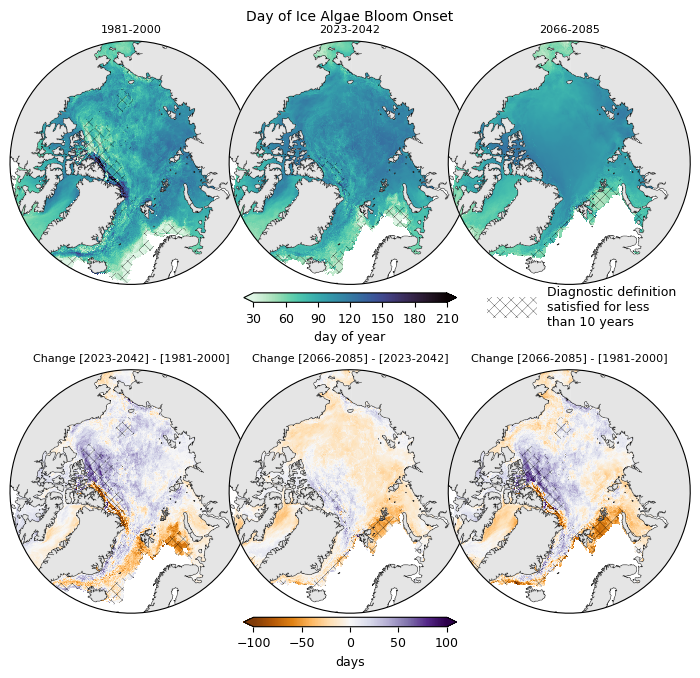

In [47]:
keydateplot_article('doyIAstd','Day of Ice Algae Bloom Onset')
plt.savefig('../figs/IAphenology23/bloomOnset-300dpi.png',bbox_inches='tight',dpi=300)
plt.savefig('../figs/IAphenology23/bloomOnset-90dpi.png',bbox_inches='tight',dpi=90)

#### IA spring max

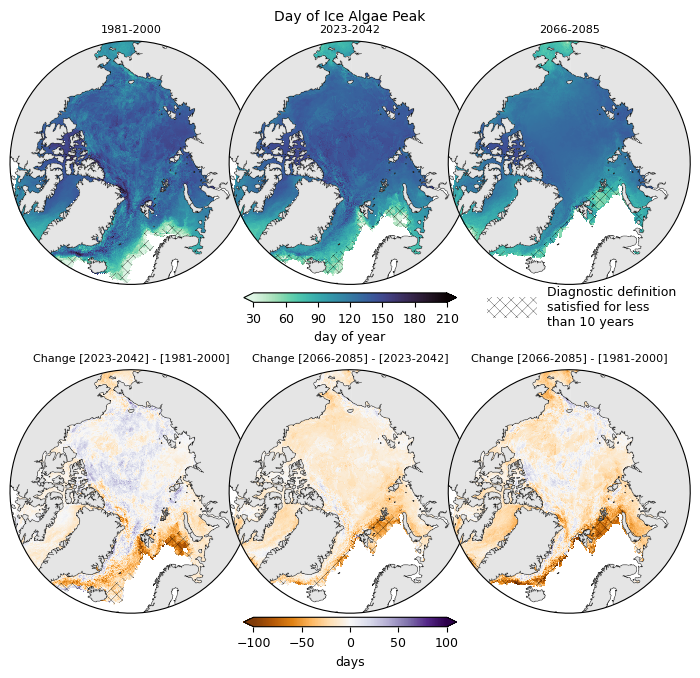

In [48]:
keydateplot_article('doyIApeak','Day of Ice Algae Peak')
plt.savefig('../figs/IAphenology23/dayIAmax-300dpi.png',bbox_inches='tight',dpi=300)
plt.savefig('../figs/IAphenology23/dayIAmax-90dpi.png',bbox_inches='tight',dpi=90)

#### SI break-up

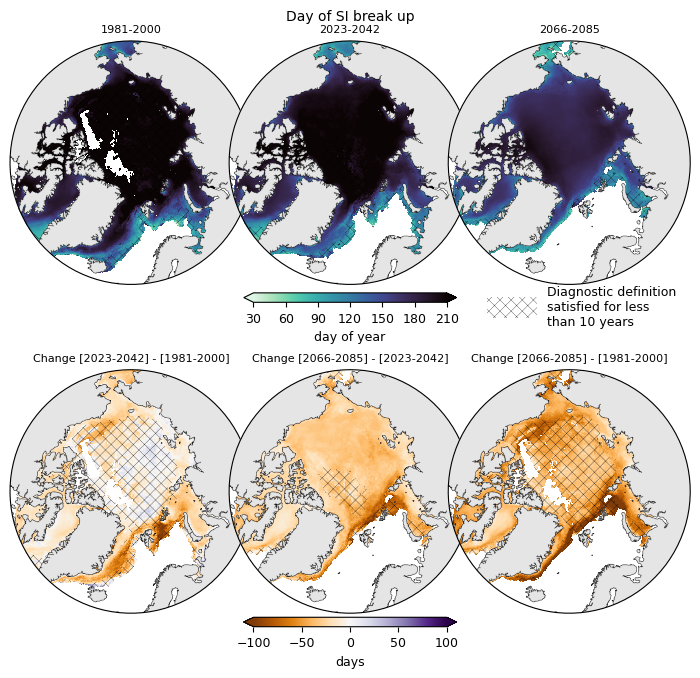

In [55]:
keydateplot_article('doySIbreak','Day of SI break up')
plt.savefig('../figs/IAphenology23/SIbreakup-300dpi.png',bbox_inches='tight',dpi=300)
plt.savefig('../figs/IAphenology23/SIbreakup-90dpi.png',bbox_inches='tight',dpi=90)

#### Freeze-up

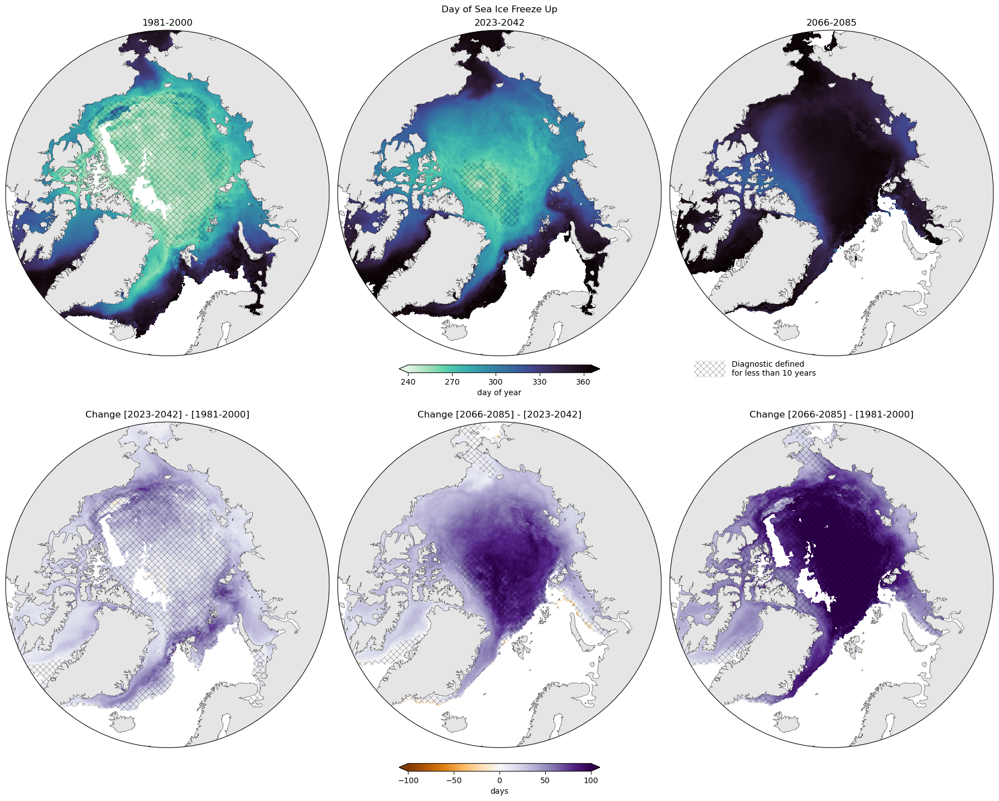

In [50]:
kdate='doySIfreezeUp'
fig,ax = mplt.initmaps(2,3,figsize=(18,14),rnd=True,extent=[-180,180, 62,90])
fig.suptitle('Day of Sea Ice Freeze Up')
fig.tight_layout()
fig.subplots_adjust(hspace=0.1)

for i,per in enumerate(periods):
    f,a,pl=mplt.singleMap(climdiag[per][kdate], dadic, fig=fig,ax=ax[0,i], cbar=False, 
                          title=per, vmin=240,vmax=365, cmap = sns.color_palette("mako_r", as_cmap=True),
                          hatchMsk=climdiag[per][kdate+'_nyears']<10, hatchlw=0.2, 
                         )
cbar_ax = fig.add_axes([0.5-0.1, 0.5+0.01, 0.2, 0.01])                               
cl = fig.colorbar(pl,cax=cbar_ax, extend='both', orientation='horizontal', shrink=0.4)
cl.set_label('day of year')
cbar_ax.set_xticks(range(240,365,30))

leg = cbar_ax.legend(loc='lower center', bbox_to_anchor=(1.9, -1.5), handlelength=4, frameon=False,
    handles=[mpatches.Patch(facecolor='w',hatch=r'xxx',label='Diagnostic defined \nfor less than 10 years')])
leg.get_patches()[0].set_height(22)
leg.get_patches()[0].set_y(-7)


for i in [1,2]:
    f,a,pl=mplt.singleMap(climdiag[periods[i]][kdate] - climdiag[past][kdate], 
                          dadic, fig=fig,ax=ax[1,(i-1)*2],  
                              title=f'Change [{periods[i]}] - [{past}]', cbar=False, vmin=-100,vmax=100,
                              cmap='PuOr',
                          hatchMsk=(climdiag[periods[i]][kdate+'_nyears']<10)|(climdiag[past][kdate+'_nyears']<10),  hatchlw=0.3,
                               )

f,a,pl=mplt.singleMap(climdiag[futur][kdate] - climdiag[pres][kdate], dadic, fig=fig,ax=ax[1,1],  
                      title=f'Change [{futur}] - [{pres}]', cbar=False, vmin=-100,vmax=100, #cmap='PuOr',
                      cmap='PuOr',
                      hatchMsk=(climdiag[futur][kdate+'_nyears']<10)|(climdiag[pres][kdate+'_nyears']<10), hatchlw=0.2,
                           )
cbar_ax = fig.add_axes([0.5-0.1, 0., 0.2, 0.01])                               
cl = fig.colorbar(pl,cax=cbar_ax, extend='both', orientation='horizontal', shrink=0.4)
cl.set_label('days')


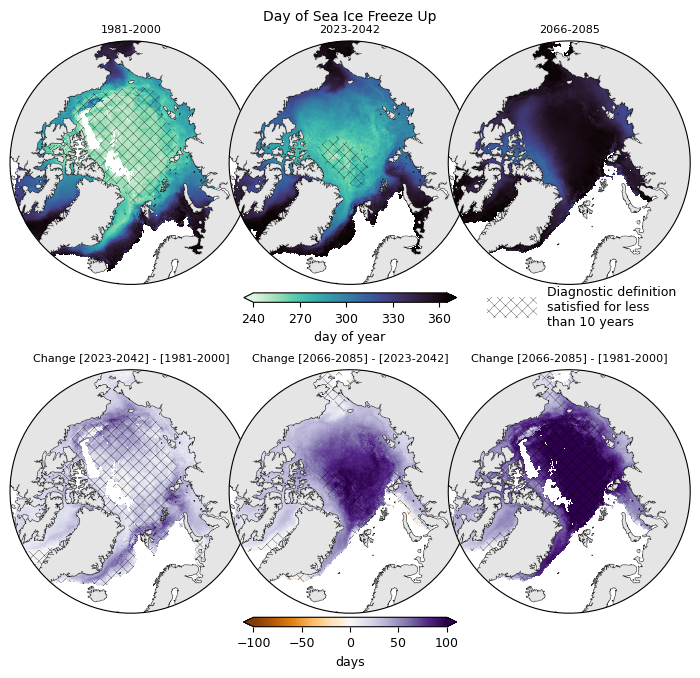

In [49]:
kdate='doySIfreezeUp'
fig,ax = mplt.initmaps(2,3,figsize=(18/2.54,16/2.54),rnd=True,extent=[-180,180, 62,90])
fig.suptitle('Day of Sea Ice Freeze Up',fontsize=10)
fig.tight_layout()
fig.subplots_adjust(hspace=0.35,wspace=-0.1,top=0.93)

for i,per in enumerate(periods):
    f,a,pl=mplt.singleMap(climdiag[per][kdate], dadic, fig=fig,ax=ax[0,i], cbar=False, 
                          title=per, vmin=240,vmax=365, cmap = sns.color_palette("mako_r", as_cmap=True),
                          hatchMsk=climdiag[per][kdate+'_nyears']<10, hatchlw=0.2, 
                         )
    ax[0,i].set_title(per, fontsize=8)

cbar_ax = fig.add_axes([0.5-0.15, 0.5+0.015, 0.3, 0.015])                               
cl = fig.colorbar(pl,cax=cbar_ax, extend='both', orientation='horizontal', shrink=0.4)
cl.set_label('day of year')
cbar_ax.set_xticks(range(240,365,30))

leg = cbar_ax.legend(loc='lower center', bbox_to_anchor=(1.7, -4), handlelength=4, frameon=False,
    handles=[mpatches.Patch(facecolor='w',hatch=r'xxx',label='Diagnostic definition\nsatisfied for less\nthan 10 years')])
leg.get_patches()[0].set_height(15)
leg.get_patches()[0].set_y(-4)


for i in [1,2]:
    f,a,pl=mplt.singleMap(climdiag[periods[i]][kdate] - climdiag[past][kdate], 
                          dadic, fig=fig,ax=ax[1,(i-1)*2],  
                              title=None, cbar=False, vmin=-100,vmax=100,
                              cmap='PuOr',
                          hatchMsk=(climdiag[periods[i]][kdate+'_nyears']<10)|(climdiag[past][kdate+'_nyears']<10),  hatchlw=0.3,
                               )
    ax[1,(i-1)*2].set_title(f'Change [{periods[i]}] - [{past}]', fontsize=8)

f,a,pl=mplt.singleMap(climdiag[futur][kdate] - climdiag[pres][kdate], dadic, fig=fig,ax=ax[1,1],  
                      title=None, cbar=False, vmin=-100,vmax=100, #cmap='PuOr',
                      cmap='PuOr',
                      hatchMsk=(climdiag[futur][kdate+'_nyears']<10)|(climdiag[pres][kdate+'_nyears']<10), hatchlw=0.2,
                           )
ax[1,1].set_title(f'Change [{futur}] - [{pres}]', fontsize=8)

cbar_ax = fig.add_axes([0.5-0.15, 0.0, 0.3, 0.015])                               
cl = fig.colorbar(pl,cax=cbar_ax, extend='both', orientation='horizontal', shrink=0.4)
cl.set_label('days')

plt.savefig('../figs/IAphenology23/freezeup-300dpi.png',bbox_inches='tight',dpi=300)
plt.savefig('../figs/IAphenology23/freezeup-90dpi.png',bbox_inches='tight',dpi=90)

### Key dates Per time period

In [ ]:
fig,ax = mplt.initmaps(3,4,figsize=(18,14),rnd=True,extent=[-180,180, 62,90])
fig.tight_layout()

ax[0,0].set_title('Day of Half PAR limitation', fontsize=16)
ax[0,1].set_title('Day of Limitation Switch', fontsize=16)
ax[0,2].set_title('Day of Half N Limitation', fontsize=16)
ax[0,3].set_title('Day of Sea Ice Break up', fontsize=16)


for i,per in enumerate(periods):

    ax[i,0].text(-0.1,0.38, per, rotation='vertical', transform=ax[i,0].transAxes, fontsize=16)

    f,a,pl=mplt.singleMap(climdiag[per]['doyPARlim5'], dadic, fig=fig,ax=ax[i,0], cbar=False, 
                          vmin=30,vmax=210, cmap = sns.color_palette("mako_r", as_cmap=True),
                          hatchMsk=climdiag[per].doyPARlim5_nyears<10, hatchlw=0.2, 
                         )
    
    f,a,pl=mplt.singleMap(climdiag[per]['doyPARlimGTnlim'], dadic, fig=fig,ax=ax[i,1], cbar=False, 
                      vmin=30,vmax=210, cmap=sns.color_palette("mako_r", as_cmap=True),
                      hatchMsk=climdiag[per].doyPARlimGTnlim_nyears<10, hatchlw=0.2,
                     )

    f,a,pl=mplt.singleMap(climdiag[per]['doyNlim5'], dadic, fig=fig,ax=ax[i,2], cbar=False, 
                          vmin=30,vmax=210, cmap =sns.color_palette("mako_r", as_cmap=True),
                          hatchMsk=climdiag[per].doyNlim5_nyears<10, hatchlw=0.2,
                         )
    
    f,a,pl=mplt.singleMap(climdiag[per]['doySIbreak'], dadic, fig=fig,ax=ax[i,3], cbar=False, 
                          vmin=30,vmax=210,  cmap =sns.color_palette("mako_r", as_cmap=True),
                          hatchMsk=climdiag[per].doySIbreak_nyears<10, hatchlw=0.2, hatchColor='w',
                         )

plt.subplots_adjust(wspace=0.1,hspace=0.1)
cbar_ax = fig.add_axes([1/2-0.07, 1/3-0.01, 0.14, 0.01])                               
cl = fig.colorbar(pl,cax=cbar_ax, extend='both', orientation='horizontal', shrink=0.4)
cl.set_label('day of year')
cbar_ax.set_xticks(range(30,211,30))

leg = cbar_ax.legend(loc='lower center',bbox_to_anchor=(0.5, 1.3), handlelength=4, frameon=False,
handles=[mpatches.Patch(facecolor='w',hatch=r'xxx',label='Diagnostic defined \nfor less than 10 years')])
leg.get_patches()[0].set_height(22)
leg.get_patches()[0].set_y(-7)

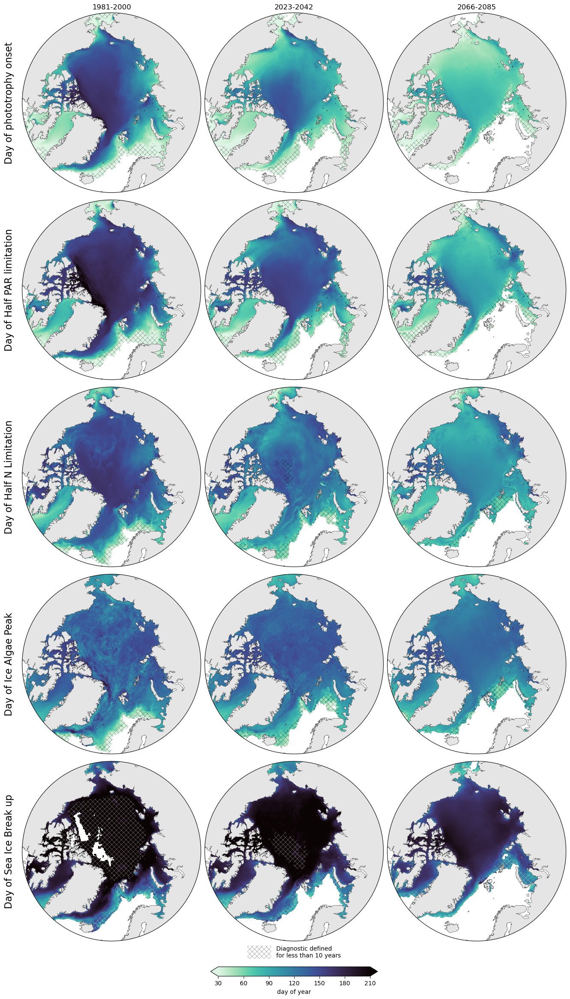

In [51]:
fig,ax = mplt.initmaps(5,3,figsize=(13,22),rnd=True,extent=[-180,180, 62,90])
fig.tight_layout()

ax[0,0].text(-0.1,0.5, 'Day of phototrophy onset', rotation='vertical', transform=ax[0,0].transAxes, fontsize=16, verticalalignment='center')
ax[1,0].text(-0.1,0.5, 'Day of Half PAR limitation', rotation='vertical', transform=ax[1,0].transAxes, fontsize=16, verticalalignment='center')
ax[2,0].text(-0.1,0.5, 'Day of Half N Limitation', rotation='vertical', transform=ax[2,0].transAxes, fontsize=16, verticalalignment='center')
ax[3,0].text(-0.1,0.5, 'Day of Ice Algae Peak', rotation='vertical', transform=ax[3,0].transAxes, fontsize=16, verticalalignment='center')
# ax[3,0].text(-0.1,0.5, 'Day of Limitation Switch', rotation='vertical', transform=ax[2,0].transAxes, fontsize=16, verticalalignment='center')
ax[4,0].text(-0.1,0.5, 'Day of Sea Ice Break up', rotation='vertical', transform=ax[4,0].transAxes, fontsize=16, verticalalignment='center')


for i,per in enumerate(periods):
    ax[0,i].set_title(per)

    f,a,pl=mplt.singleMap(climdiag[per]['doyPARlim15'], dadic, fig=fig,ax=ax[0,i], cbar=False, 
                          vmin=30,vmax=210, cmap = sns.color_palette("mako_r", as_cmap=True),
                          hatchMsk=climdiag[per].doyPARlim15_nyears<10, hatchlw=0.2, 
                         )

    f,a,pl=mplt.singleMap(climdiag[per]['doyPARlim5'], dadic, fig=fig,ax=ax[1,i], cbar=False, 
                          vmin=30,vmax=210, cmap = sns.color_palette("mako_r", as_cmap=True),
                          hatchMsk=climdiag[per].doyPARlim5_nyears<10, hatchlw=0.2, 
                         )
    
    f,a,pl=mplt.singleMap(climdiag[per]['doyNlim5'], dadic, fig=fig,ax=ax[2,i], cbar=False, 
                          vmin=30,vmax=210, cmap =sns.color_palette("mako_r", as_cmap=True),
                          hatchMsk=climdiag[per].doyNlim5_nyears<10, hatchlw=0.2,
                         )
    
    # f,a,pl=mplt.singleMap(climdiag[per]['doyPARlimGTnlim'], dadic, fig=fig,ax=ax[3,i], cbar=False, 
    #                   vmin=30,vmax=210, cmap=sns.color_palette("mako_r", as_cmap=True),
    #                   hatchMsk=climdiag[per].doyPARlimGTnlim_nyears<10, hatchlw=0.2,
    #                  )

    f,a,pl=mplt.singleMap(climdiag[per]['doyIApeak'], dadic, fig=fig,ax=ax[3,i], cbar=False, 
                      vmin=30,vmax=210, cmap =sns.color_palette("mako_r", as_cmap=True),
                      hatchMsk=climdiag[per].doyIApeak_nyears<10, hatchlw=0.2,
                     )

    f,a,pl=mplt.singleMap(climdiag[per]['doySIbreak'], dadic, fig=fig,ax=ax[4,i], cbar=False, 
                          vmin=30,vmax=210,  cmap =sns.color_palette("mako_r", as_cmap=True),
                          hatchMsk=climdiag[per].doySIbreak_nyears<10, hatchlw=0.2, hatchColor='w',
                         )

# plt.subplots_adjust(wspace=0.1,hspace=0.1)
cbar_ax = fig.add_axes([1/2-0.15, -0.03, 0.3, 0.01])                               
cl = fig.colorbar(pl,cax=cbar_ax, extend='both', orientation='horizontal', shrink=0.4)
cl.set_label('day of year')
cbar_ax.set_xticks(range(30,211,30))

leg = cbar_ax.legend(loc='lower center',bbox_to_anchor=(0.5, 1.3), handlelength=4, frameon=False,
                     handles=[mpatches.Patch(facecolor='w',hatch=r'xxx',label='Diagnostic defined \nfor less than 10 years')])
leg.get_patches()[0].set_height(22)
leg.get_patches()[0].set_y(-7)

## IA peak vs growth periods

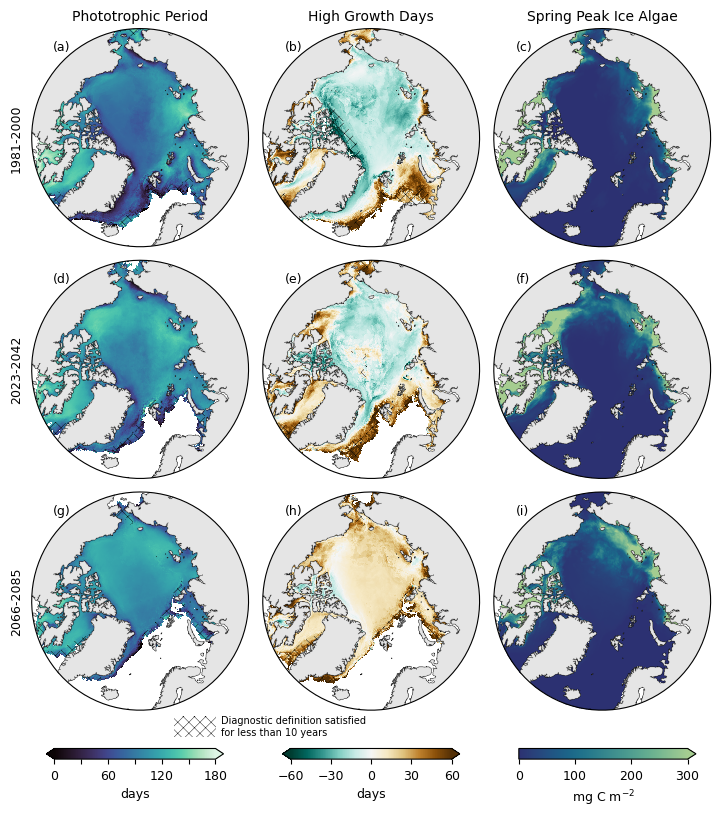

In [44]:
fig,ax = mplt.initmaps(3,3,figsize=(18/2.54,18/2.54),rnd=True,extent=[-180,180, 62,90])
plt.rcParams.update({'font.size': 9})

# fig,ax = mplt.initmaps(3,3,figsize=(16,17),rnd=True,extent=[-180,180, 62,90])

fig.tight_layout()

# BrBG_r_shifted, normBrBG_r_shifted, ticks = mplt.shiftCMAP(-30, 60, 0,'BrBG_r')

ax[0,0].set_title('Phototrophic Period',fontsize=10)
ax[0,1].set_title('High Growth Days',fontsize=10)
ax[0,2].set_title('Spring Peak Ice Algae',fontsize=10)

for i,per in enumerate(periods):
    
    ax[i,0].text(-0.1,0.5, per, rotation='vertical', transform=ax[i,0].transAxes, verticalalignment='center')
    
    f,a,pl0=mplt.singleMap(climdiag[per]['lengthPAR'], dadic, fig=fig,ax=ax[i,0], cbar=False, 
                           cmap='mako', vmin=0, vmax=180,
                          hatchMsk=climdiag[per].lengthPAR_nyears<10, hatchlw=0.3,                           
                           )

    f,a,pl1=mplt.singleMap(climdiag[per]['nonLimGwth'], dadic, fig=fig,ax=ax[i,1], cbar=False, 
                           vmin=-60,vmax=60, cmap='BrBG_r',
                          # cmap=BrBG_r_shifted,norm=normBrBG_r_shifted,
                          hatchMsk=climdiag[per].nonLimGwth_nyears<10, hatchlw=0.3,                           
                           )
    
    f,a,pl2=mplt.singleMap(clim[per+'peakIA']*12, dadic, fig=fig,ax=ax[i,2], cbar=False, 
                      cmap='crest_r', 
                      # cmap="crest_r",
                      # norm=colors.LogNorm(vmin=1, vmax=1000),
                      vmin=0,vmax=300,
                       )

ltr=['a','b','c','d','e','f','g','h','i','j','k','l','m','n','o','p','q','r','s','t','u','v','w','x','y','z']
for il,a in enumerate(fig.axes): a.text(0.1,0.9,f'({ltr[il]})',transform=a.transAxes)

cbar_ax = fig.add_axes([1/6-0.125, -0.05, 0.25, 0.015])                               
cl = fig.colorbar(pl0,cax=cbar_ax, extend='both', orientation='horizontal', shrink=0.4)
cl.set_label('days')
cl.set_ticks(range(0,181,30),labels=['0',' ','60',' ','120',' ','180'])

leg = cbar_ax.legend(loc='lower center', bbox_to_anchor=(1.35, 1.25), handlelength=4, frameon=False,
    handles=[mpatches.Patch(facecolor='w',hatch=r'xxx',label='Diagnostic definition satisfied \nfor less than 10 years')], fontsize=7)
leg.get_patches()[0].set_height(15)
leg.get_patches()[0].set_width(30)
leg.get_patches()[0].set_y(-5)

cbar_ax = fig.add_axes([1/3+1/6-0.125, -0.05, 0.25, 0.015])                               
cl = fig.colorbar(pl1,cax=cbar_ax, extend='both', orientation='horizontal', shrink=0.4)
cl.set_label('days')
# cl.set_ticks( ticks ) 
cl.set_ticks( range(-60,61,30) ) 
cbar_ax.tick_params(which='minor',length=0)

cbar_ax = fig.add_axes([2/3+1/6-0.125, -0.05, 0.25, 0.015])                               
cl = fig.colorbar(pl2,cax=cbar_ax, extend='max', orientation='horizontal', shrink=0.4)
cl.set_label('mg C m$^{-2}$')
# cbar_ax.set_xticks([1,10,100,1000], [1,10,100,1000]);



plt.savefig('../figs/IAphenology23/growthPeriods-peakIA-300dpi.png',bbox_inches='tight',dpi=300)
plt.savefig('../figs/IAphenology23/growthPeriods-peakIA-90dpi.png',bbox_inches='tight',dpi=90)

### IA changes vs growth periods changes

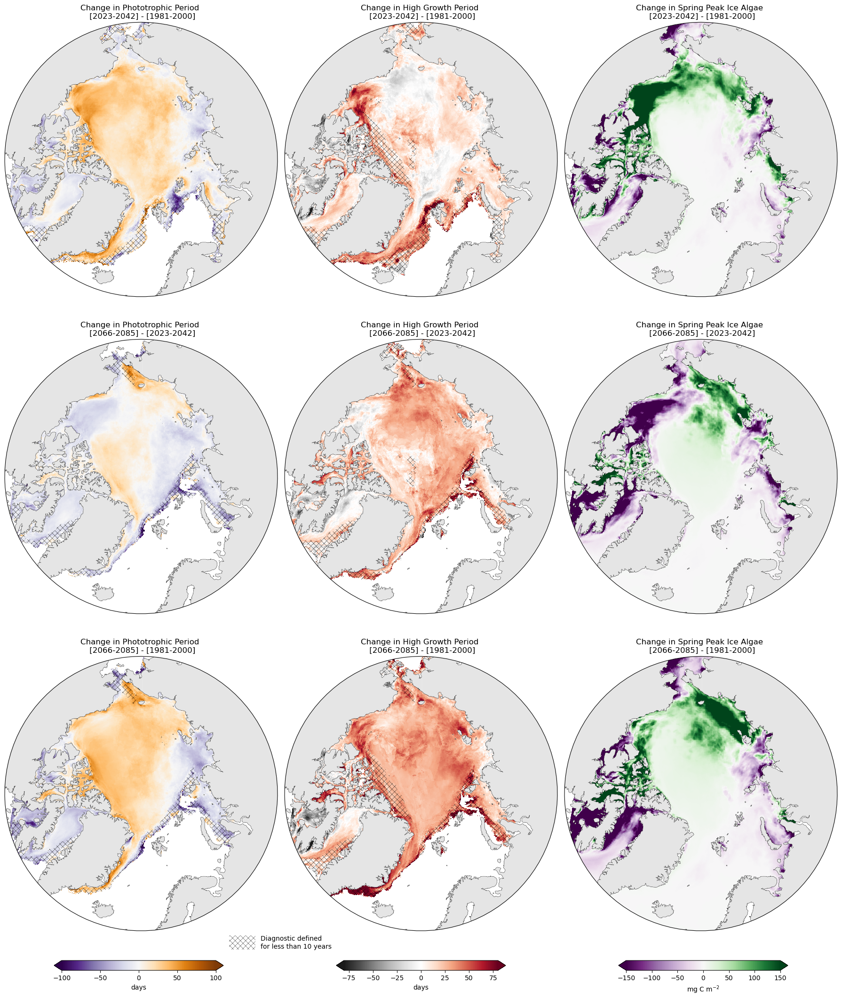

In [9]:
fig,ax = mplt.initmaps(3,3,figsize=(18,21),rnd=True,extent=[-180,180, 62,90])
fig.tight_layout()

for i in [1,2]:

    f,a,pllb=mplt.singleMap(climdiag[periods[i]]['lengthPAR'] - climdiag[past]['lengthPAR'], 
                          dadic, fig=fig,ax=ax[(i-1)*2,0],  
                              title=f'Change in Phototrophic Period \n [{periods[i]}] - [{past}]', cbar=False, vmin=-100,vmax=100,
                              cmap='PuOr_r',
                          hatchMsk=(climdiag[periods[i]].lengthPAR_nyears<10)|(climdiag[past].lengthPAR_nyears<10),  hatchlw=0.3,
                               )

    f,a,pllnl=mplt.singleMap(climdiag[periods[i]]['nonLimGwth'] - climdiag[past]['nonLimGwth'], 
                          dadic, fig=fig,ax=ax[(i-1)*2,1],  
                              title=f'Change in High Growth Period \n [{periods[i]}] - [{past}]', cbar=False, vmin=-80,vmax=80,
                              cmap='RdGy_r',
                          hatchMsk=(climdiag[periods[i]].nonLimGwth_nyears<10)|(climdiag[past].nonLimGwth_nyears<10),  hatchlw=0.3,
                               )
    
    f,a,plia=mplt.singleMap( (clim[periods[i]+'peakIA'] - clim[past+'peakIA'])*12, 
                            dadic, fig=fig,ax=ax[(i-1)*2,2],  
                              title=f'Change in Spring Peak Ice Algae \n [{periods[i]}] - [{past}]', cbar=False, vmin=-150,vmax=150,
                              cmap='PRGn',
                               )



f,a,pllb=mplt.singleMap(climdiag[futur]['lengthPAR'] - climdiag[pres]['lengthPAR'], 
                      dadic, fig=fig,ax=ax[1,0],  
                          title=f'Change in Phototrophic Period \n [{futur}] - [{pres}]', cbar=False, vmin=-100,vmax=100,
                          cmap='PuOr_r',
                      hatchMsk=(climdiag[futur].lengthPAR_nyears<10)|(climdiag[pres].lengthPAR_nyears<10),  hatchlw=0.3,
                           )

f,a,pllnl=mplt.singleMap(climdiag[futur]['nonLimGwth'] - climdiag[pres]['nonLimGwth'], 
                      dadic, fig=fig,ax=ax[1,1],  
                          title=f'Change in High Growth Period \n [{futur}] - [{pres}]', cbar=False, vmin=-80,vmax=80,
                          cmap='RdGy_r',
                      hatchMsk=(climdiag[futur].nonLimGwth_nyears<10)|(climdiag[pres].nonLimGwth_nyears<10),  hatchlw=0.3,
                           )

f,a,plia=mplt.singleMap( (clim[futur+'peakIA'] - clim[pres+'peakIA'])*12, 
                        dadic, fig=fig,ax=ax[1,2],  
                          title=f'Change in Spring Peak Ice Algae \n [{futur}] - [{pres}]', cbar=False, vmin=-150,vmax=150,
                          cmap='PRGn',
                           )


    
    
    
    
cbar_ax = fig.add_axes([1/3/2-0.1, 0., 0.2, 0.01])                               
cl = fig.colorbar(pllb,cax=cbar_ax, extend='both', orientation='horizontal', shrink=0.4)
cl.set_label('days')

leg = cbar_ax.legend(loc='lower center', bbox_to_anchor=(1.42, 1.5), handlelength=4, frameon=False,
    handles=[mpatches.Patch(facecolor='w',hatch=r'xxx',label='Diagnostic defined \nfor less than 10 years')])
leg.get_patches()[0].set_height(22)
leg.get_patches()[0].set_y(-7)


cbar_ax = fig.add_axes([1/3+1/3/2-0.1, 0., 0.2, 0.01])                               
cl = fig.colorbar(pllnl,cax=cbar_ax, extend='both', orientation='horizontal', shrink=0.4)
cl.set_label('days')
cbar_ax.tick_params(which='minor',length=0)


cbar_ax = fig.add_axes([2/3+1/3/2-0.1, 0., 0.2, 0.01])                               
cl = fig.colorbar(plia,cax=cbar_ax, extend='both', orientation='horizontal', shrink=0.4)
cl.set_label('mg C m$^{-2}$')


plt.savefig('figs/IAphenology23/Change-growthPeriods-peakIA-200dpi.png',bbox_inches='tight',dpi=200)
